<a href="https://colab.research.google.com/github/JhulianaM/Mammography/blob/master/interpolacionx2SR.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import files
files.upload()  # Sube el archivo kaggle.json

!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

!kaggle datasets download -d kmader/mias-mammography
!unzip mias-mammography.zip -d mias

Saving kaggle.json to kaggle.json
Dataset URL: https://www.kaggle.com/datasets/kmader/mias-mammography
License(s): other
 98% 305M/312M [00:03<00:00, 84.6MB/s]
100% 312M/312M [00:03<00:00, 92.7MB/s]
Archive:  mias-mammography.zip
  inflating: mias/Info.txt           
  inflating: mias/all-mias.tar.gz    
  inflating: mias/all-mias/Info.txt  
  inflating: mias/all-mias/Licence.txt  
  inflating: mias/all-mias/README    
  inflating: mias/all-mias/mdb001.pgm  
  inflating: mias/all-mias/mdb002.pgm  
  inflating: mias/all-mias/mdb003.pgm  
  inflating: mias/all-mias/mdb004.pgm  
  inflating: mias/all-mias/mdb005.pgm  
  inflating: mias/all-mias/mdb006.pgm  
  inflating: mias/all-mias/mdb007.pgm  
  inflating: mias/all-mias/mdb008.pgm  
  inflating: mias/all-mias/mdb009.pgm  
  inflating: mias/all-mias/mdb010.pgm  
  inflating: mias/all-mias/mdb011.pgm  
  inflating: mias/all-mias/mdb012.pgm  
  inflating: mias/all-mias/mdb013.pgm  
  inflating: mias/all-mias/mdb014.pgm  
  inflating: mias

Evaluando método de interpolación: Nearest


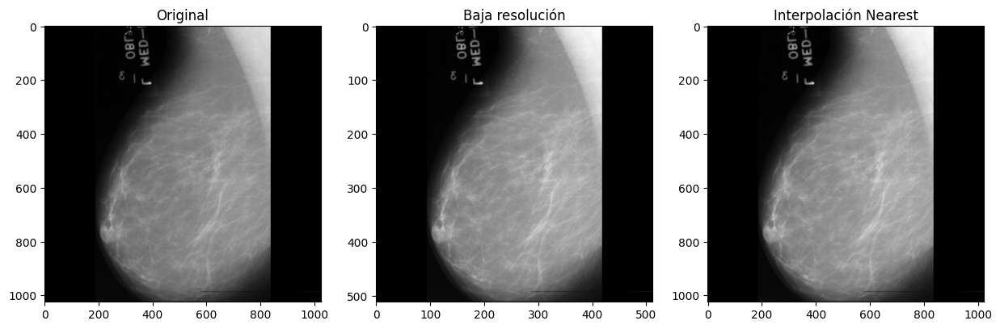

<ipython-input-3-93ca60b10013>:75: UserWarning: Inputs have mismatched dtype.  Setting data_range based on image_true.
  psnr_value = compare_psnr(original_img, interpolated_img_gray)
/usr/local/lib/python3.10/dist-packages/skimage/_shared/utils.py:348: UserWarning: Inputs have mismatched dtype.  Setting data_range based on im1.dtype.
  return func(*args, **kwargs)


Imagen 1 - PSNR: 9.69, SSIM: 0.3988


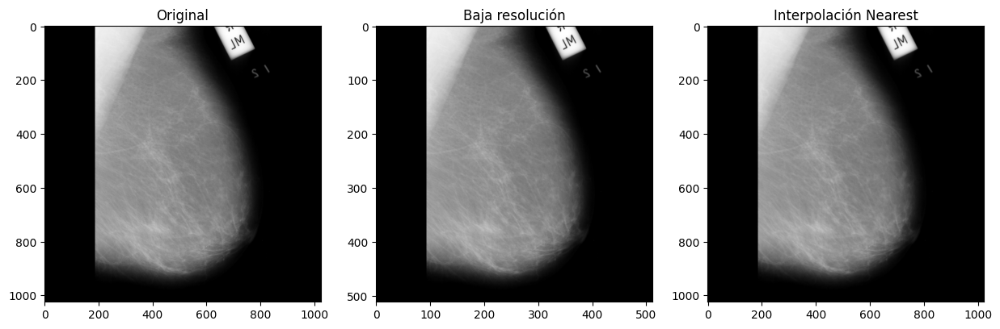

Imagen 2 - PSNR: 8.99, SSIM: 0.4839


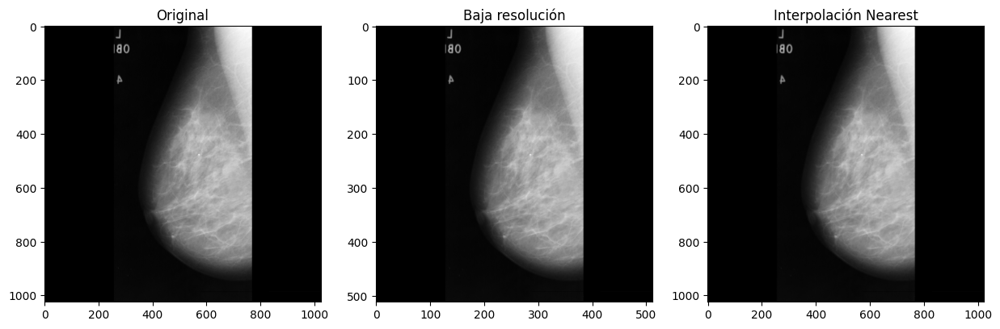

Imagen 3 - PSNR: 11.35, SSIM: 0.5354


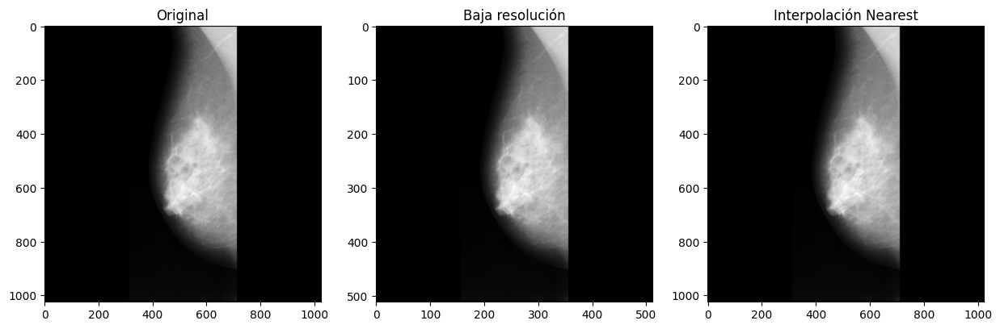

Imagen 4 - PSNR: 12.77, SSIM: 0.6960


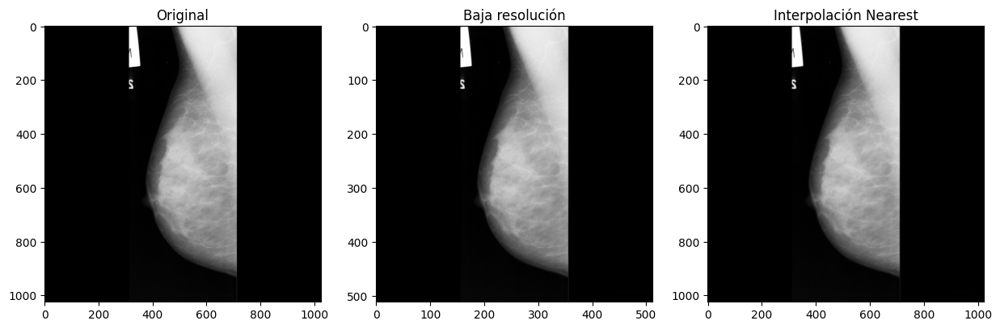

Imagen 5 - PSNR: 10.38, SSIM: 0.6861
PSNR promedio Nearest: 10.63, SSIM promedio Nearest: 0.5600

Evaluando método de interpolación: Linear


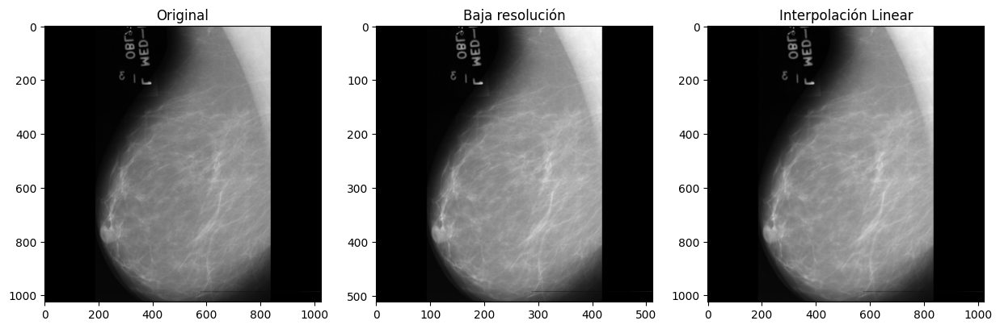

Imagen 1 - PSNR: 9.69, SSIM: 0.3988


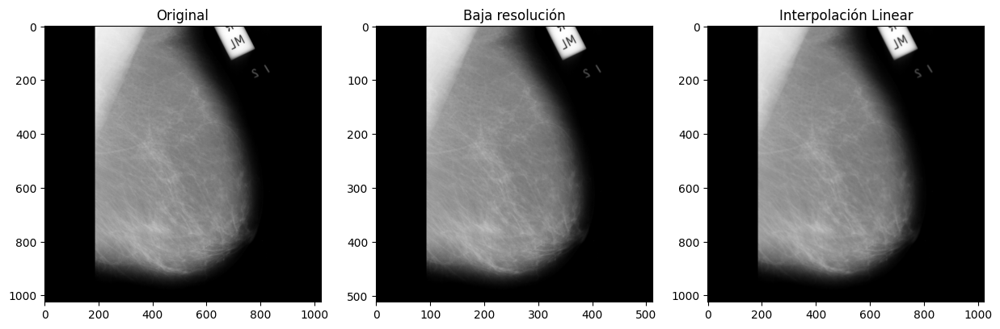

Imagen 2 - PSNR: 8.99, SSIM: 0.4839


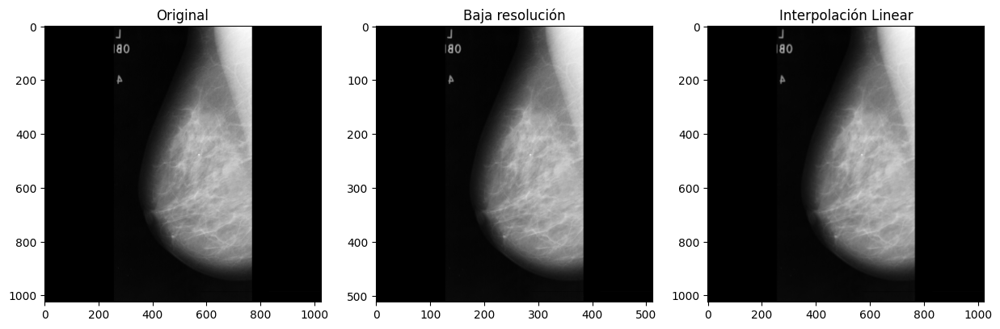

Imagen 3 - PSNR: 11.35, SSIM: 0.5354


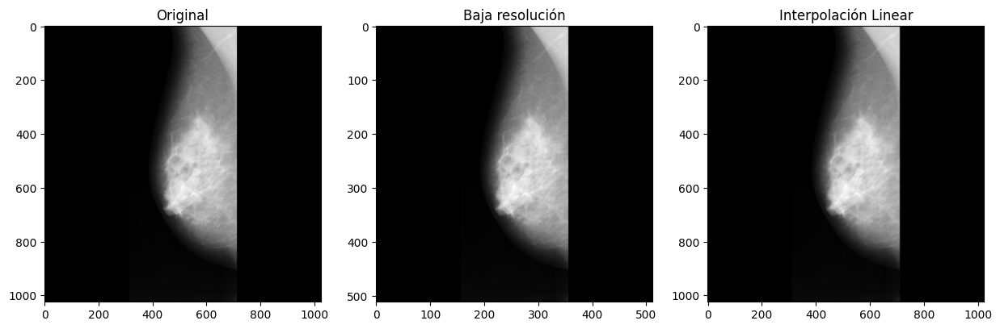

Imagen 4 - PSNR: 12.77, SSIM: 0.6960


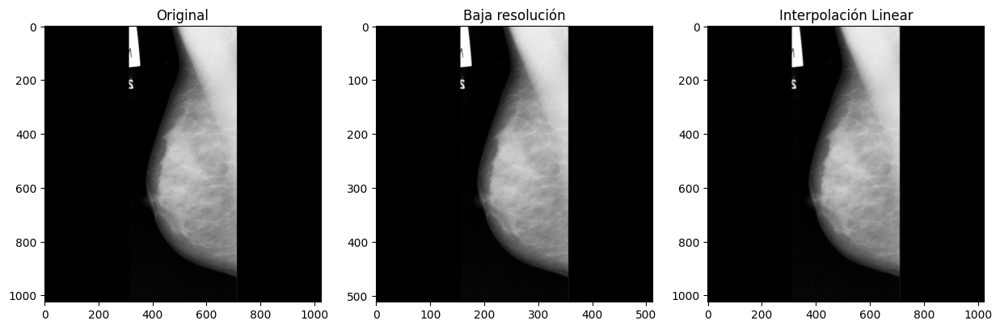

Imagen 5 - PSNR: 10.38, SSIM: 0.6861
PSNR promedio Linear: 10.63, SSIM promedio Linear: 0.5600

Evaluando método de interpolación: Cubic


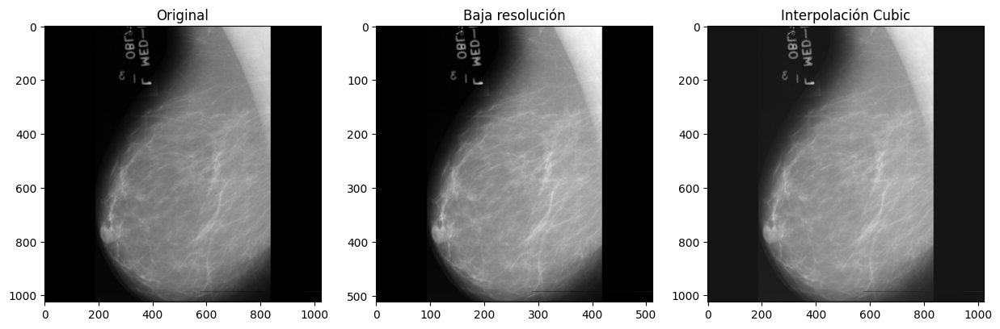

Imagen 1 - PSNR: 9.69, SSIM: 0.3988


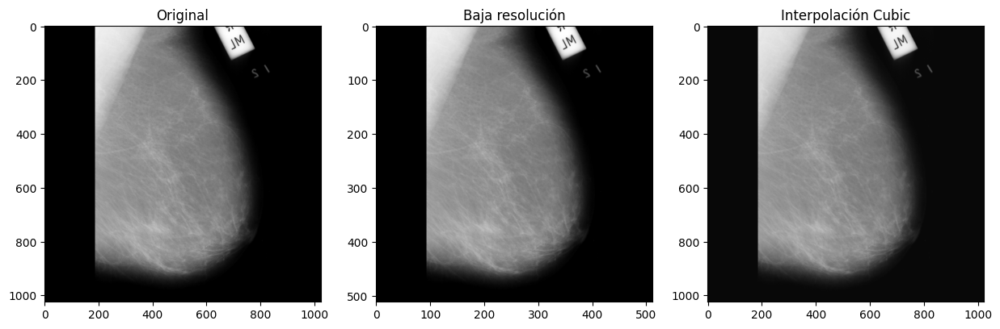

Imagen 2 - PSNR: 8.99, SSIM: 0.4839


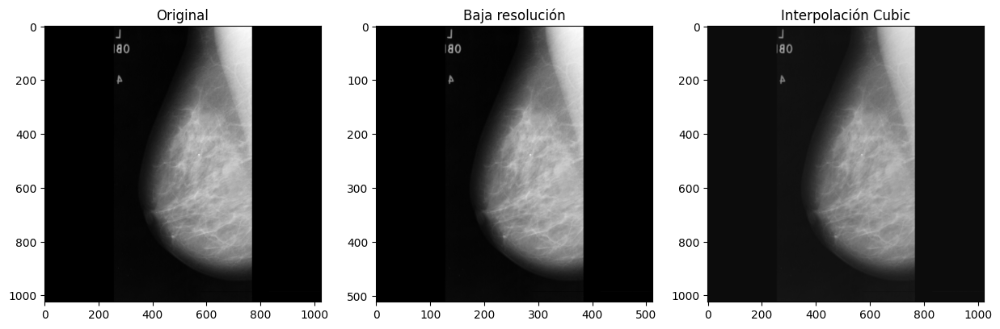

Imagen 3 - PSNR: 11.35, SSIM: 0.5354


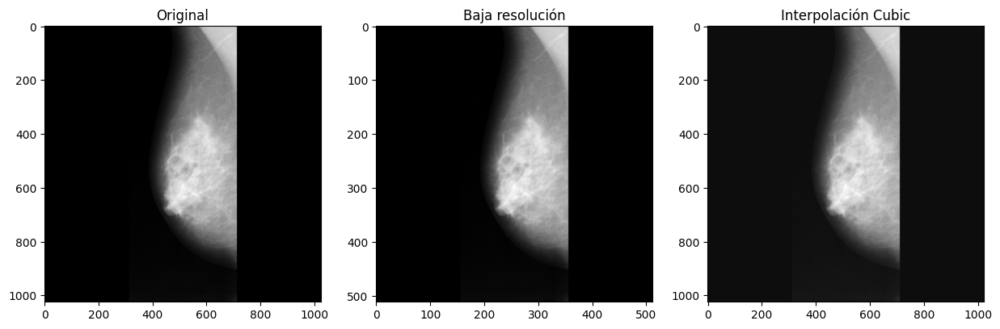

Imagen 4 - PSNR: 12.77, SSIM: 0.6960


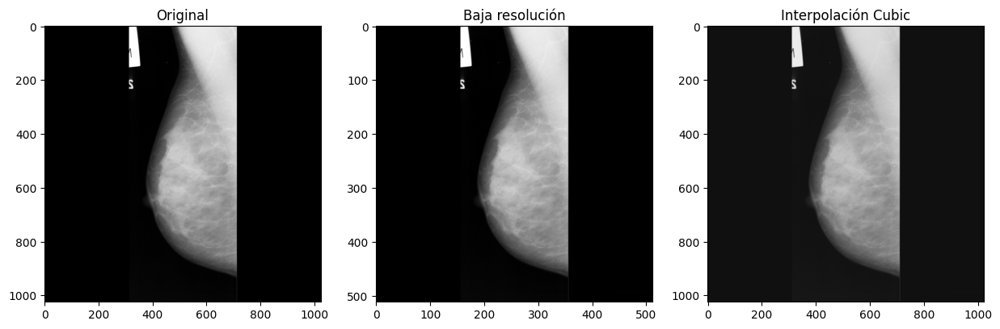

Imagen 5 - PSNR: 10.38, SSIM: 0.6861
PSNR promedio Cubic: 10.63, SSIM promedio Cubic: 0.5600

Evaluando método de interpolación: Lanczos4


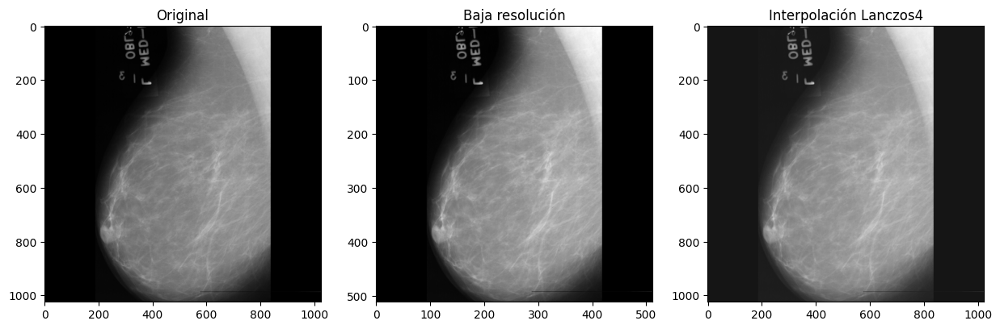

Imagen 1 - PSNR: 9.69, SSIM: 0.3988


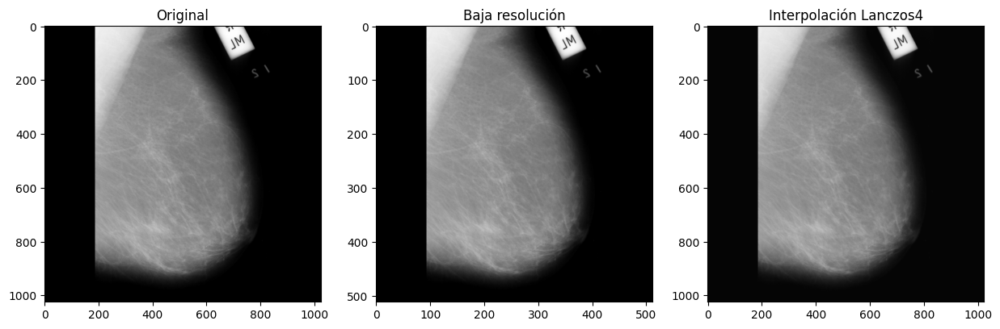

Imagen 2 - PSNR: 8.99, SSIM: 0.4839


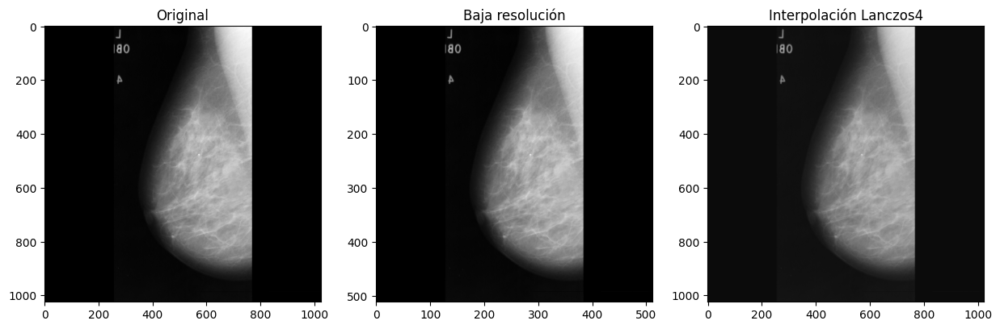

Imagen 3 - PSNR: 11.35, SSIM: 0.5354


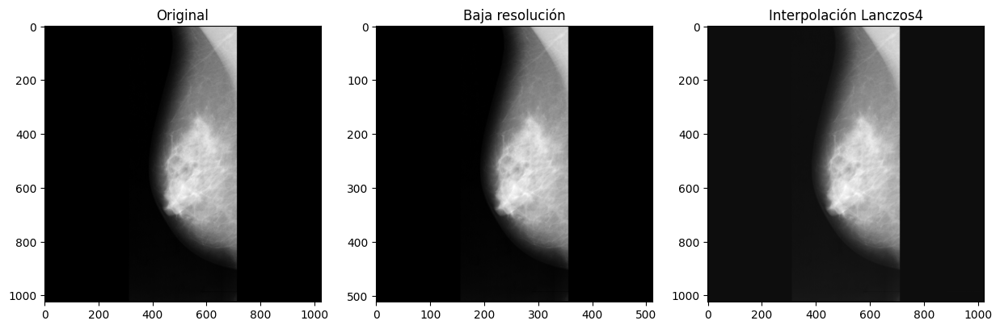

Imagen 4 - PSNR: 12.77, SSIM: 0.6960


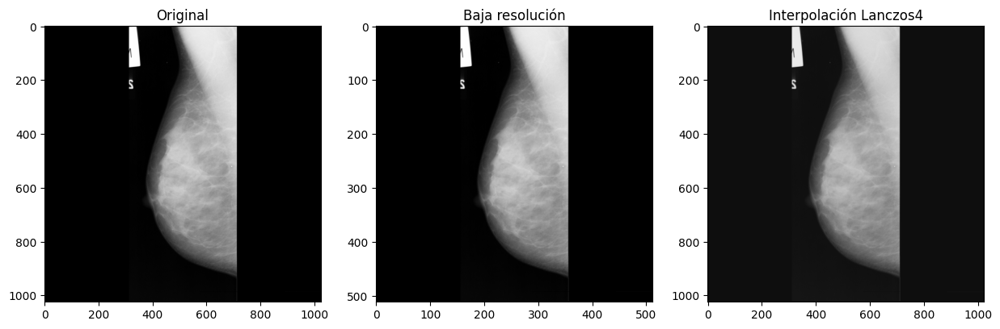

Imagen 5 - PSNR: 10.38, SSIM: 0.6861
PSNR promedio Lanczos4: 10.63, SSIM promedio Lanczos4: 0.5600



In [3]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.metrics import peak_signal_noise_ratio as compare_psnr
from skimage.metrics import structural_similarity as compare_ssim

# Directorio de imágenes
data_dir = "mias/all-mias/"

# Cargar imágenes
images = []
for file_name in os.listdir(data_dir):
    if file_name.endswith('.pgm'):
        img_path = os.path.join(data_dir, file_name)
        img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
        images.append(img)

# Normalización y preparación
images = np.array(images)
images = images.astype('float32') / 255.0

# Convertir imágenes en escala de grises a imágenes RGB
val_images = images[:10]
val_images_rgb = [np.stack((img,)*3, axis=-1) for img in val_images]

# Realizar la bajada de resolución
val_images_resized = [cv2.resize(img, (img.shape[1]//2, img.shape[0]//2)) for img in val_images_rgb]

# Añadir ruido gaussiano a las imágenes de baja resolución
#noise_std = 0.05
#val_images_noisy = [img + noise_std * np.random.randn(*img.shape) for img in val_images_resized]
#val_images_noisy = np.clip(val_images_noisy, 0, 1)  # Asegurarse de que los valores estén en el rango [0, 1]

# Convertir imágenes a uint8 para OpenCV
#val_images_noisy_uint8 = [np.uint8(img * 255) for img in val_images_resized]

# Métodos de interpolación en OpenCV
interpolation_methods = {
    "Nearest": cv2.INTER_NEAREST,
    "Linear": cv2.INTER_LINEAR,
    "Cubic": cv2.INTER_CUBIC,
    "Lanczos4": cv2.INTER_LANCZOS4
}

# Realizar la interpolación y la comparación
for method_name, method in interpolation_methods.items():
    print(f"Evaluando método de interpolación: {method_name}")

    psnr_values = []
    ssim_values = []

    interpolated_images = [cv2.resize(img, (img.shape[1]*2, img.shape[0]*2), interpolation=method) for img in val_images_resized]

    for i in range(5):
        plt.figure(figsize=(15, 5))

        plt.subplot(1, 3, 1)
        plt.title('Original')
        plt.imshow(val_images[i], cmap='gray')

        plt.subplot(1, 3, 2)
        plt.title('Baja resolución')
        plt.imshow(cv2.cvtColor(val_images_resized[i], cv2.COLOR_BGR2GRAY), cmap='gray')

        plt.subplot(1, 3, 3)
        plt.title(f'Interpolación {method_name}')
        plt.imshow(cv2.cvtColor(interpolated_images[i], cv2.COLOR_BGR2GRAY), cmap='gray')
        plt.show()

        # Calcular PSNR y SSIM
        original_img = (val_images[i] * 255).astype(np.uint8)
        interpolated_img_gray = cv2.cvtColor(interpolated_images[i], cv2.COLOR_BGR2GRAY)

        psnr_value = compare_psnr(original_img, interpolated_img_gray)
        ssim_value = compare_ssim(original_img, interpolated_img_gray)

        psnr_values.append(psnr_value)
        ssim_values.append(ssim_value)

        print(f'Imagen {i+1} - PSNR: {psnr_value:.2f}, SSIM: {ssim_value:.4f}')

    # Mostrar los valores promedio de PSNR y SSIM
    average_psnr = np.mean(psnr_values)
    average_ssim = np.mean(ssim_values)
    print(f'PSNR promedio {method_name}: {average_psnr:.2f}, SSIM promedio {method_name}: {average_ssim:.4f}\n')

x2 Sin ruido

Evaluando método de interpolación: Nearest


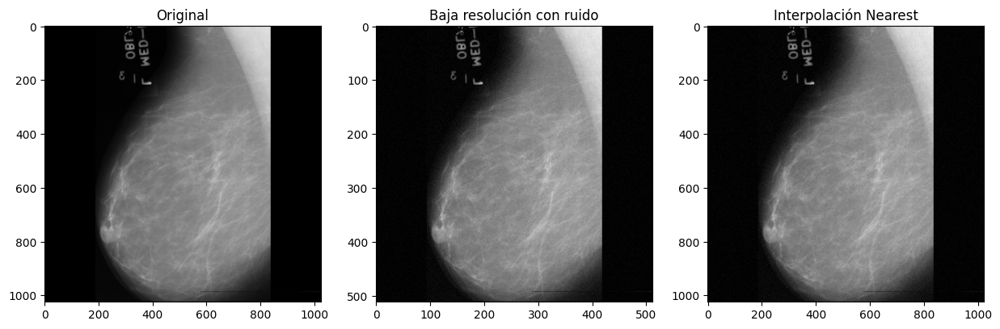

Imagen 1 - PSNR: 32.98, SSIM: 0.6264


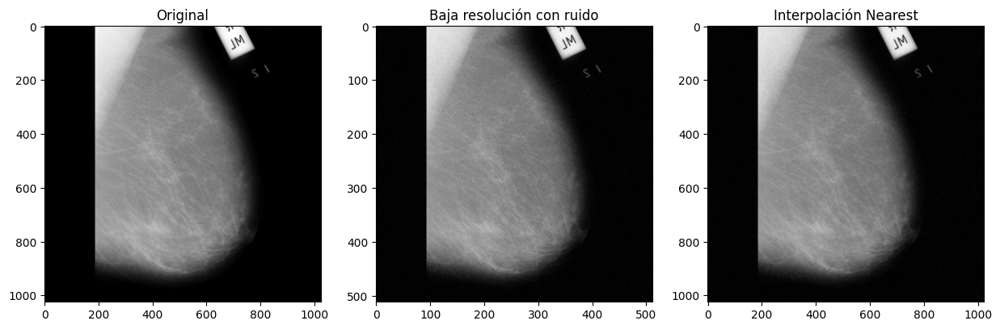

Imagen 2 - PSNR: 33.09, SSIM: 0.5900


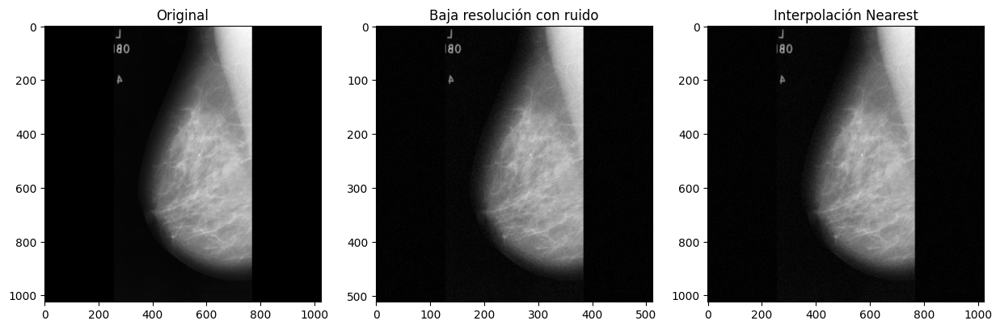

Imagen 3 - PSNR: 32.58, SSIM: 0.5928


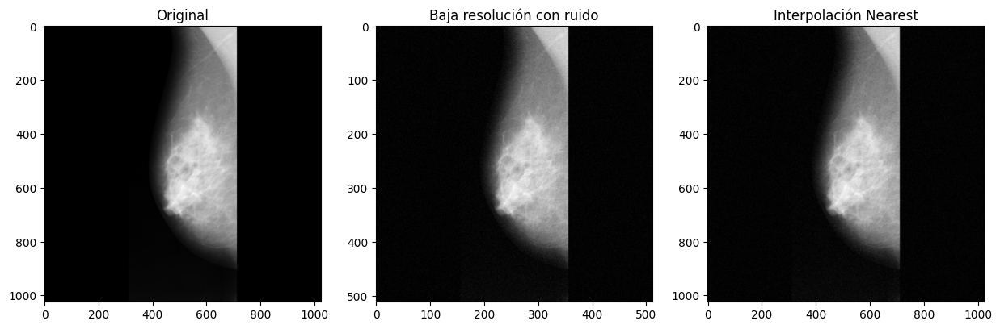

Imagen 4 - PSNR: 33.26, SSIM: 0.5376


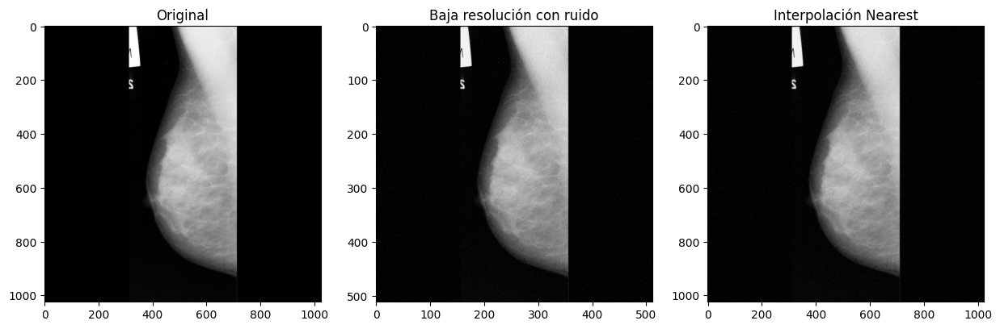

Imagen 5 - PSNR: 32.08, SSIM: 0.5457
PSNR promedio Nearest: 32.80, SSIM promedio Nearest: 0.5785

Evaluando método de interpolación: Linear


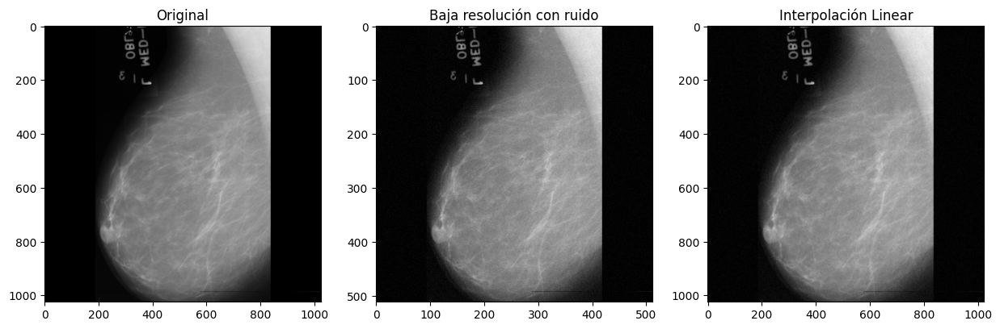

Imagen 1 - PSNR: 35.03, SSIM: 0.7173


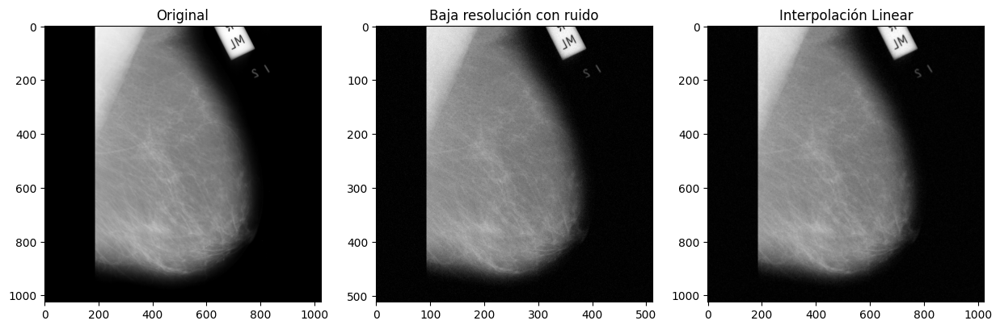

Imagen 2 - PSNR: 35.74, SSIM: 0.6724


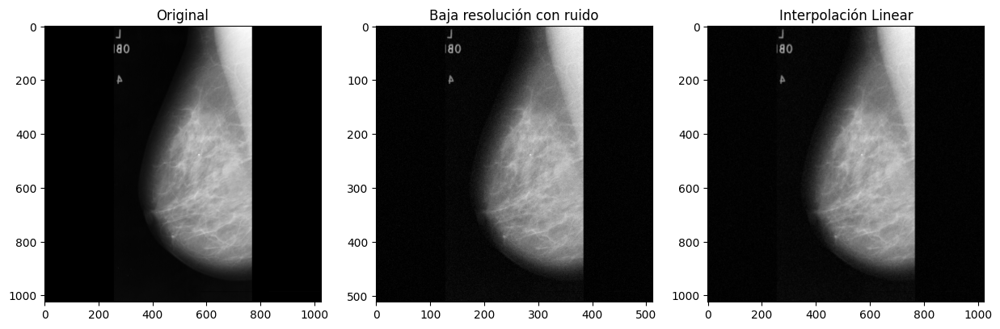

Imagen 3 - PSNR: 34.77, SSIM: 0.6695


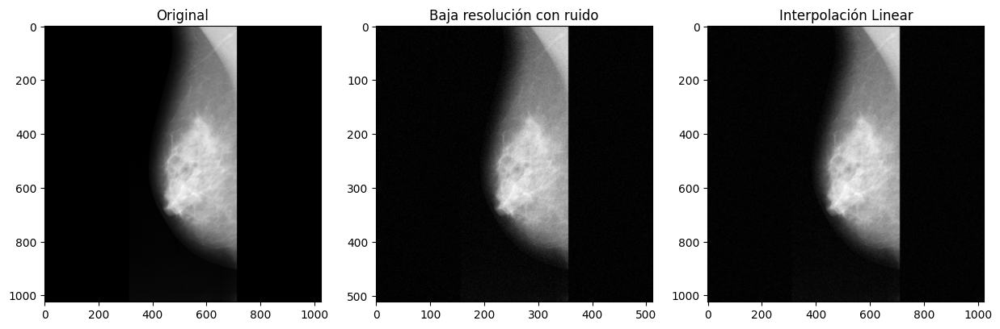

Imagen 4 - PSNR: 35.25, SSIM: 0.5989


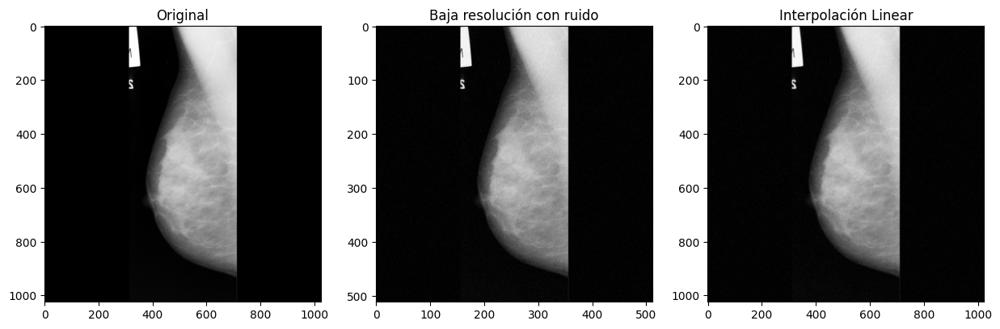

Imagen 5 - PSNR: 34.05, SSIM: 0.6068
PSNR promedio Linear: 34.97, SSIM promedio Linear: 0.6530

Evaluando método de interpolación: Cubic


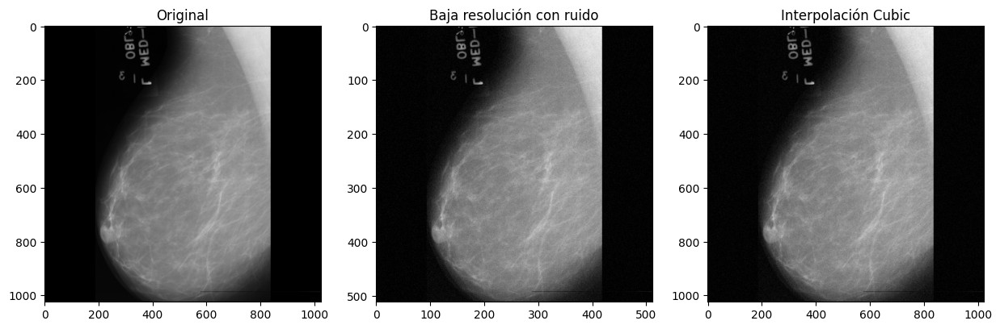

Imagen 1 - PSNR: 34.12, SSIM: 0.6593


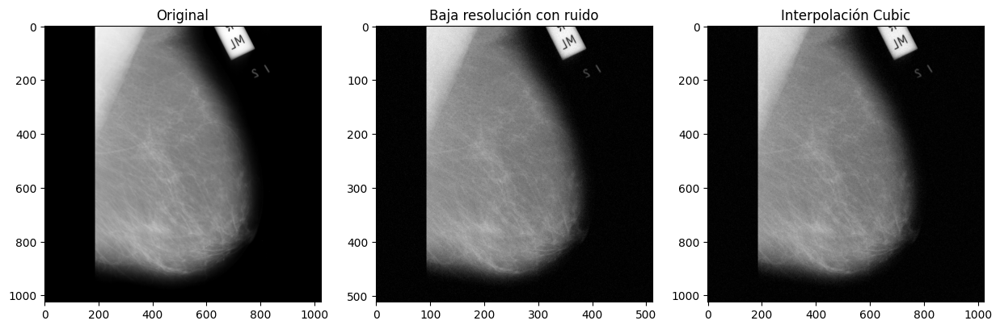

Imagen 2 - PSNR: 34.85, SSIM: 0.6167


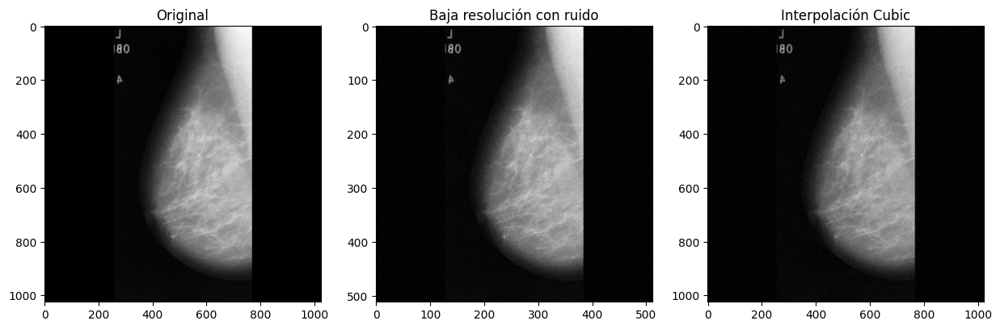

Imagen 3 - PSNR: 34.19, SSIM: 0.6165


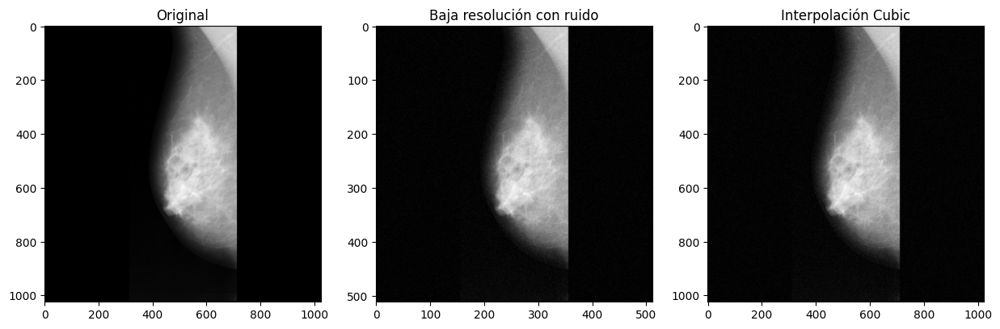

Imagen 4 - PSNR: 34.58, SSIM: 0.5499


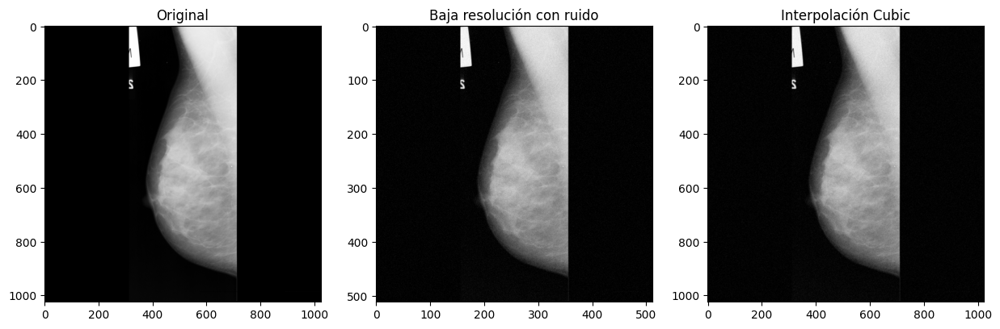

Imagen 5 - PSNR: 33.78, SSIM: 0.5582
PSNR promedio Cubic: 34.30, SSIM promedio Cubic: 0.6001

Evaluando método de interpolación: Lanczos4


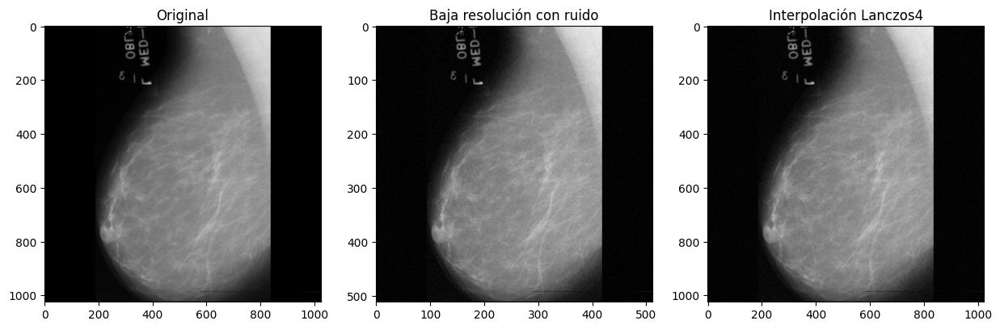

Imagen 1 - PSNR: 33.79, SSIM: 0.6382


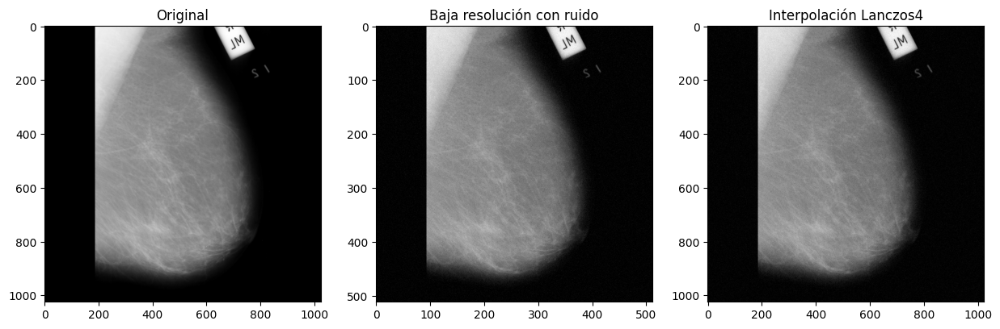

Imagen 2 - PSNR: 34.51, SSIM: 0.5960


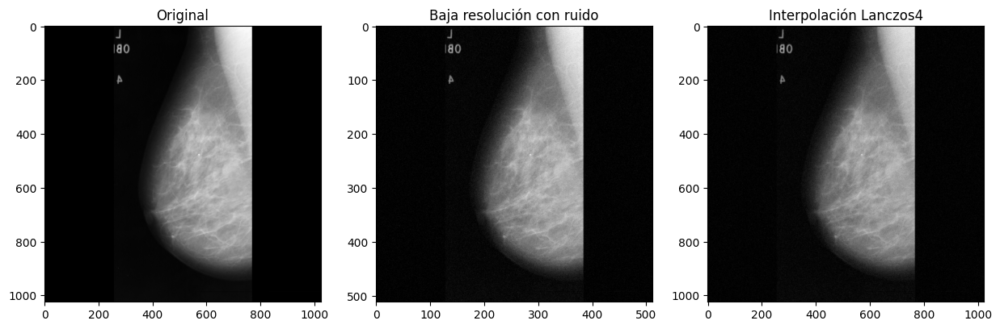

Imagen 3 - PSNR: 33.93, SSIM: 0.5973


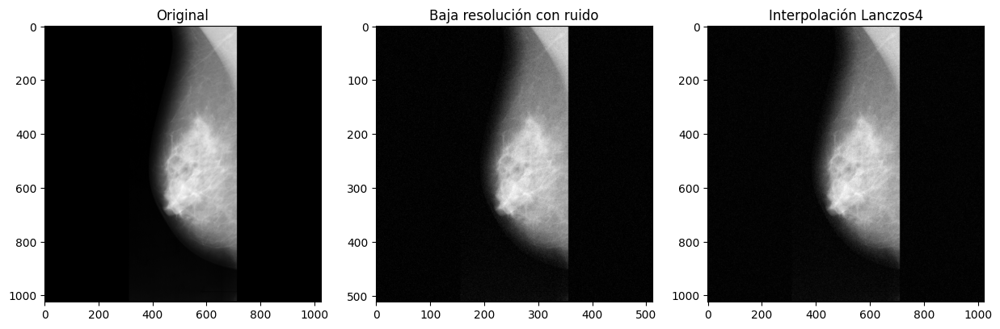

Imagen 4 - PSNR: 34.32, SSIM: 0.5304


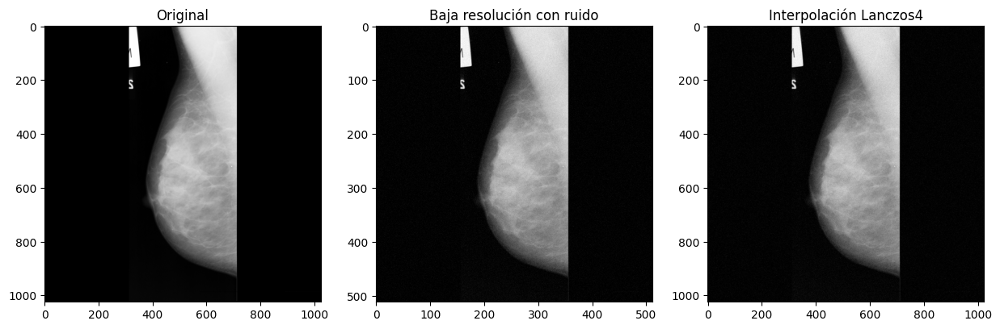

Imagen 5 - PSNR: 33.58, SSIM: 0.5385
PSNR promedio Lanczos4: 34.02, SSIM promedio Lanczos4: 0.5801



In [4]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.metrics import peak_signal_noise_ratio as compare_psnr
from skimage.metrics import structural_similarity as compare_ssim

# Directorio de imágenes
data_dir = "mias/all-mias/"

# Cargar imágenes
images = []
for file_name in os.listdir(data_dir):
    if file_name.endswith('.pgm'):
        img_path = os.path.join(data_dir, file_name)
        img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
        images.append(img)

# Normalización y preparación
images = np.array(images)
images = images.astype('float32') / 255.0

# Convertir imágenes en escala de grises a imágenes RGB
val_images = images[:10]
val_images_rgb = [np.stack((img,)*3, axis=-1) for img in val_images]

# Realizar la bajada de resolución
val_images_resized = [cv2.resize(img, (img.shape[1]//2, img.shape[0]//2)) for img in val_images_rgb]

# Añadir ruido gaussiano a las imágenes de baja resolución
noise_std = 0.03
val_images_noisy = [img + noise_std * np.random.randn(*img.shape) for img in val_images_resized]
val_images_noisy = np.clip(val_images_noisy, 0, 1)  # Asegurarse de que los valores estén en el rango [0, 1]

# Convertir imágenes a uint8 para OpenCV
val_images_noisy_uint8 = [np.uint8(img * 255) for img in val_images_noisy]

# Métodos de interpolación en OpenCV
interpolation_methods = {
    "Nearest": cv2.INTER_NEAREST,
    "Linear": cv2.INTER_LINEAR,
    "Cubic": cv2.INTER_CUBIC,
    "Lanczos4": cv2.INTER_LANCZOS4
}

# Realizar la interpolación y la comparación
for method_name, method in interpolation_methods.items():
    print(f"Evaluando método de interpolación: {method_name}")

    psnr_values = []
    ssim_values = []

    interpolated_images = [cv2.resize(img, (img.shape[1]*2, img.shape[0]*2), interpolation=method) for img in val_images_noisy_uint8]

    for i in range(5):
        plt.figure(figsize=(15, 5))

        plt.subplot(1, 3, 1)
        plt.title('Original')
        plt.imshow(val_images[i], cmap='gray')

        plt.subplot(1, 3, 2)
        plt.title('Baja resolución con ruido')
        plt.imshow(cv2.cvtColor(val_images_noisy_uint8[i], cv2.COLOR_BGR2GRAY), cmap='gray')

        plt.subplot(1, 3, 3)
        plt.title(f'Interpolación {method_name}')
        plt.imshow(cv2.cvtColor(interpolated_images[i], cv2.COLOR_BGR2GRAY), cmap='gray')
        plt.show()

        # Calcular PSNR y SSIM
        original_img = (val_images[i] * 255).astype(np.uint8)
        interpolated_img_gray = cv2.cvtColor(interpolated_images[i], cv2.COLOR_BGR2GRAY)

        psnr_value = compare_psnr(original_img, interpolated_img_gray)
        ssim_value = compare_ssim(original_img, interpolated_img_gray)

        psnr_values.append(psnr_value)
        ssim_values.append(ssim_value)

        print(f'Imagen {i+1} - PSNR: {psnr_value:.2f}, SSIM: {ssim_value:.4f}')

    # Mostrar los valores promedio de PSNR y SSIM
    average_psnr = np.mean(psnr_values)
    average_ssim = np.mean(ssim_values)
    print(f'PSNR promedio {method_name}: {average_psnr:.2f}, SSIM promedio {method_name}: {average_ssim:.4f}\n')

x2 0.05 ruido

Evaluando método de interpolación: Nearest


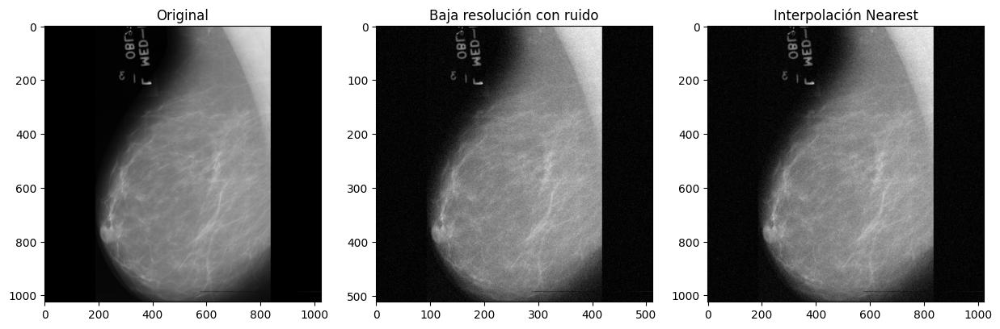

Imagen 1 - PSNR: 29.59, SSIM: 0.4099


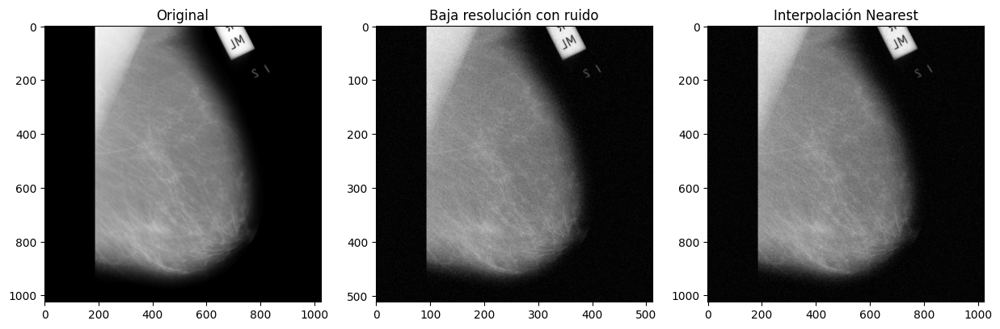

Imagen 2 - PSNR: 29.67, SSIM: 0.3705


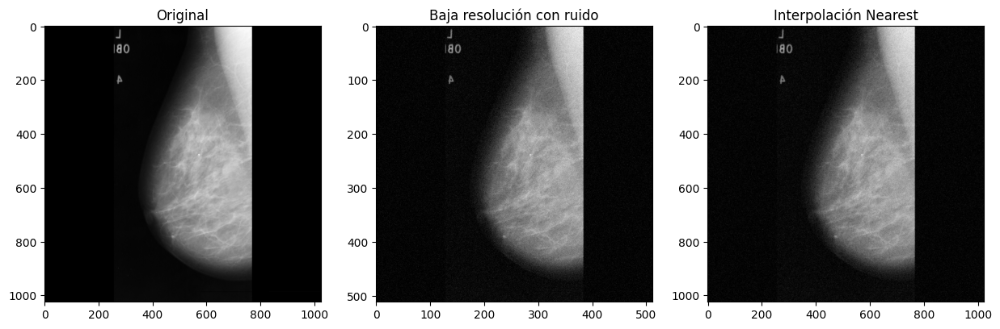

Imagen 3 - PSNR: 29.66, SSIM: 0.3784


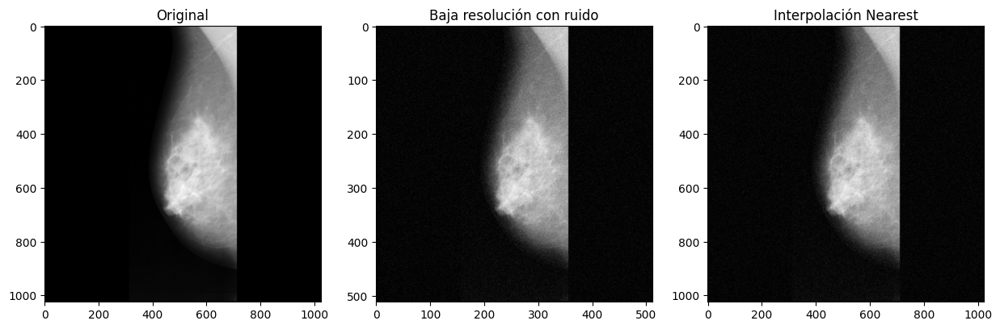

Imagen 4 - PSNR: 30.05, SSIM: 0.3143


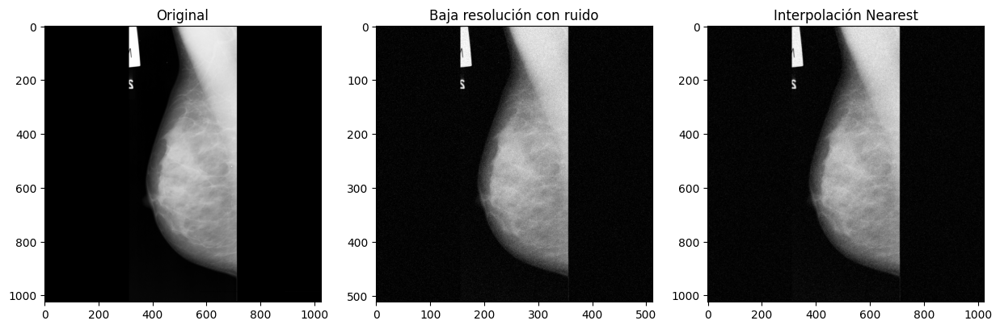

Imagen 5 - PSNR: 29.42, SSIM: 0.3215
PSNR promedio Nearest: 29.68, SSIM promedio Nearest: 0.3589

Evaluando método de interpolación: Linear


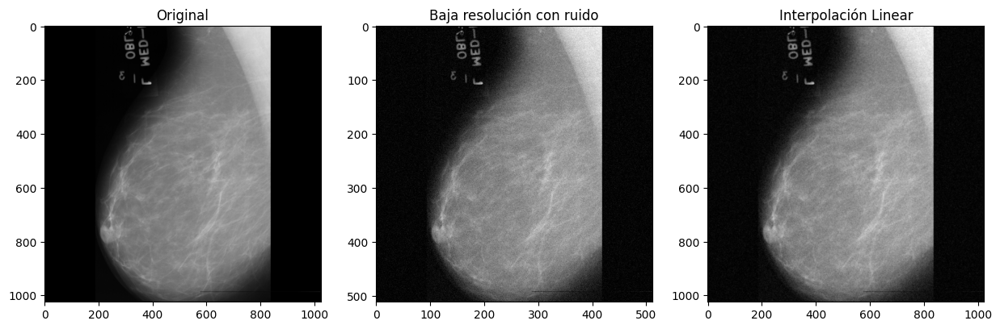

Imagen 1 - PSNR: 32.16, SSIM: 0.5471


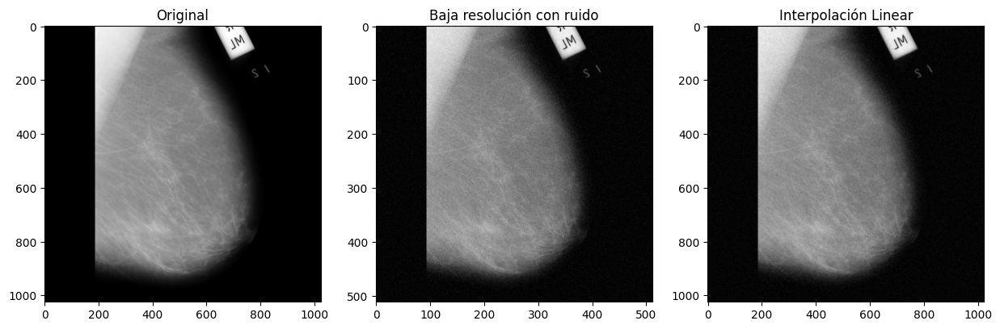

Imagen 2 - PSNR: 32.45, SSIM: 0.4929


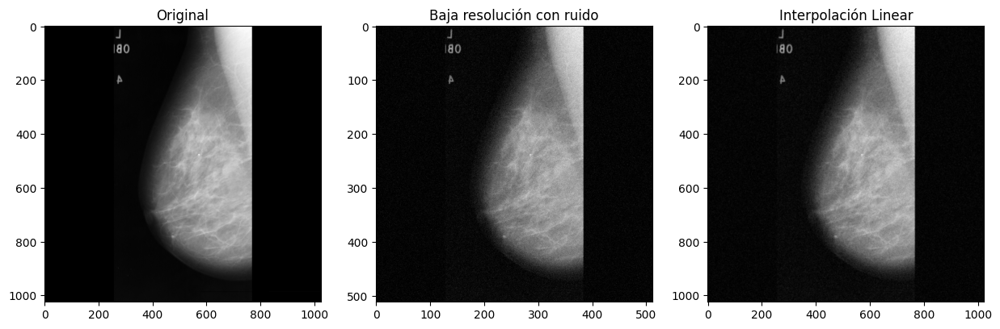

Imagen 3 - PSNR: 32.04, SSIM: 0.4897


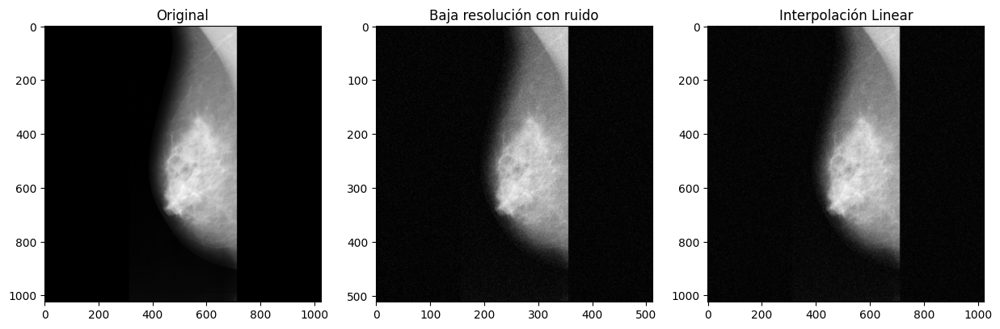

Imagen 4 - PSNR: 32.19, SSIM: 0.3985


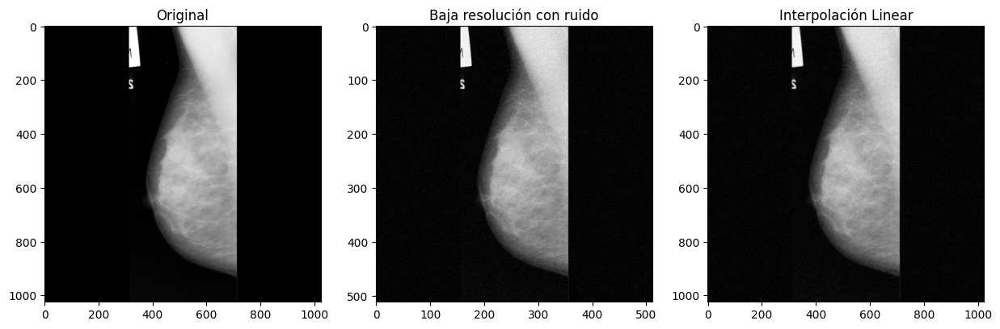

Imagen 5 - PSNR: 31.53, SSIM: 0.4059
PSNR promedio Linear: 32.08, SSIM promedio Linear: 0.4668

Evaluando método de interpolación: Cubic


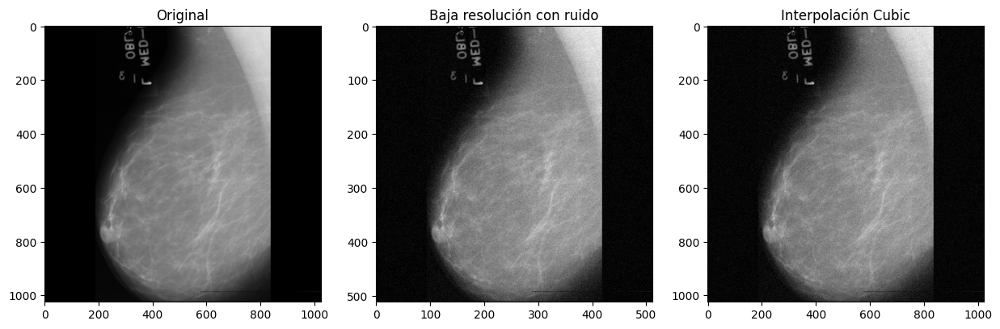

Imagen 1 - PSNR: 30.69, SSIM: 0.4594


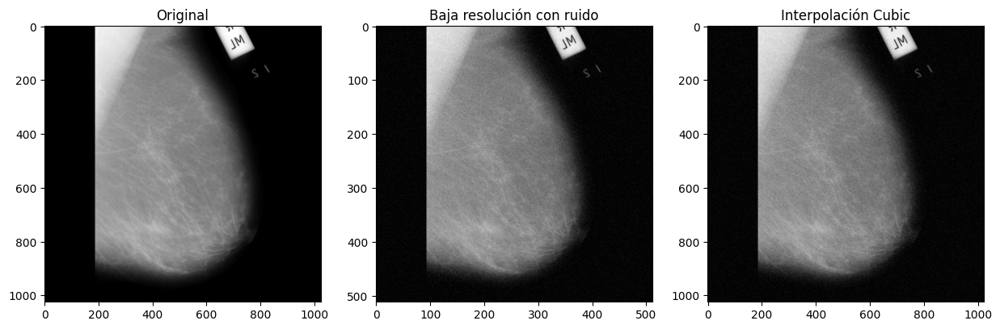

Imagen 2 - PSNR: 31.00, SSIM: 0.4132


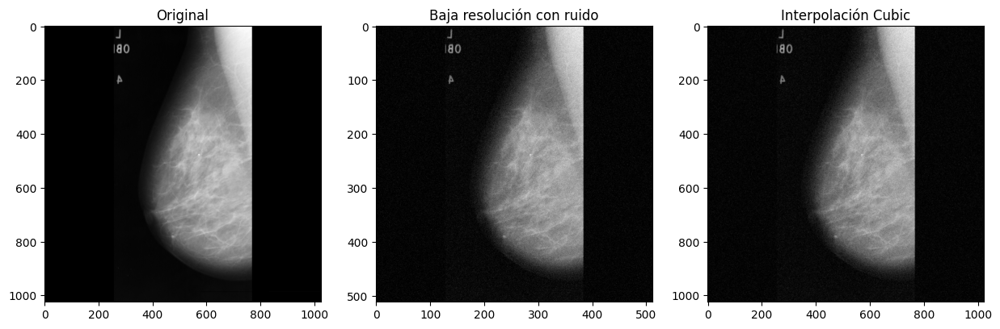

Imagen 3 - PSNR: 30.91, SSIM: 0.4177


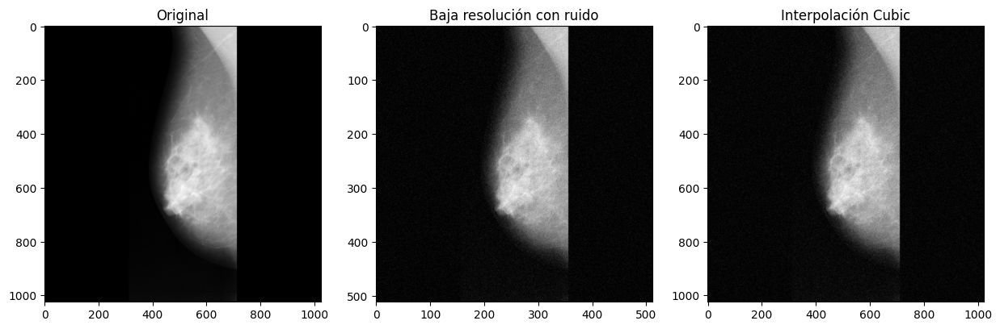

Imagen 4 - PSNR: 31.08, SSIM: 0.3395


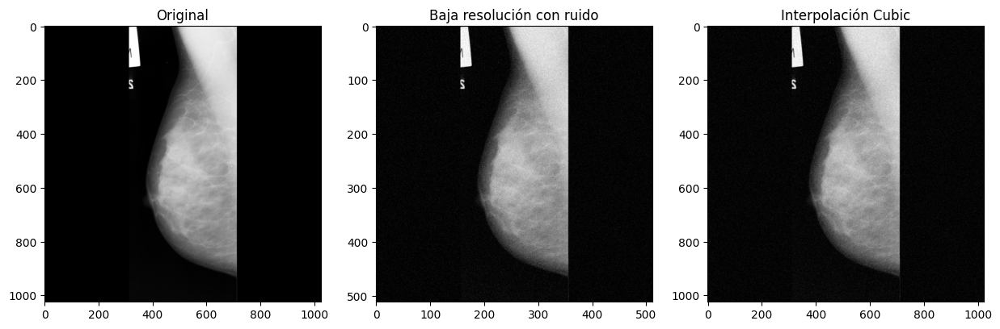

Imagen 5 - PSNR: 30.67, SSIM: 0.3467
PSNR promedio Cubic: 30.87, SSIM promedio Cubic: 0.3953

Evaluando método de interpolación: Lanczos4


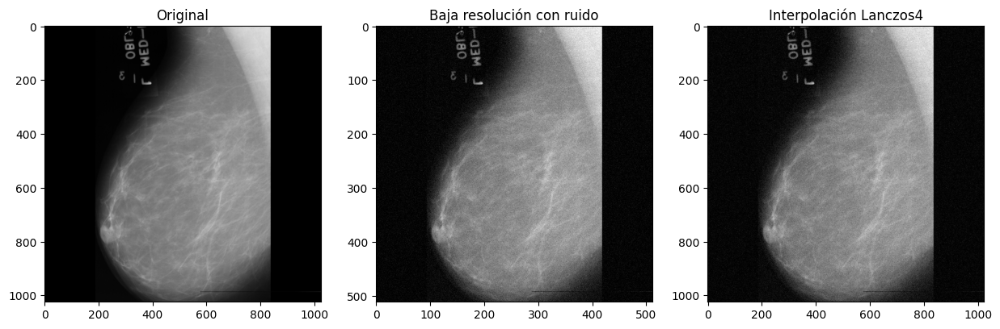

Imagen 1 - PSNR: 30.28, SSIM: 0.4339


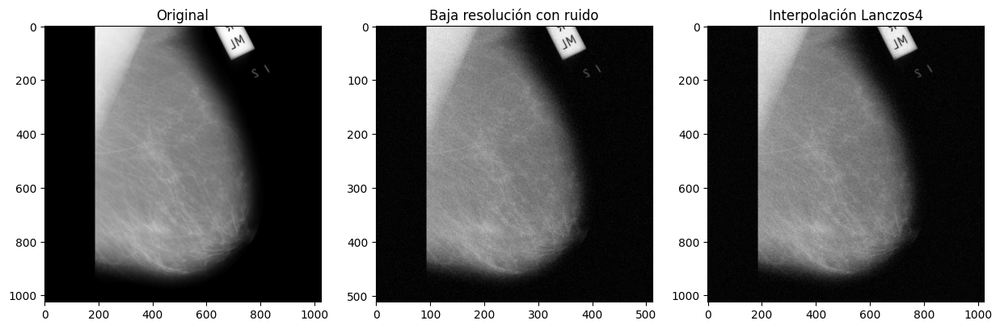

Imagen 2 - PSNR: 30.58, SSIM: 0.3895


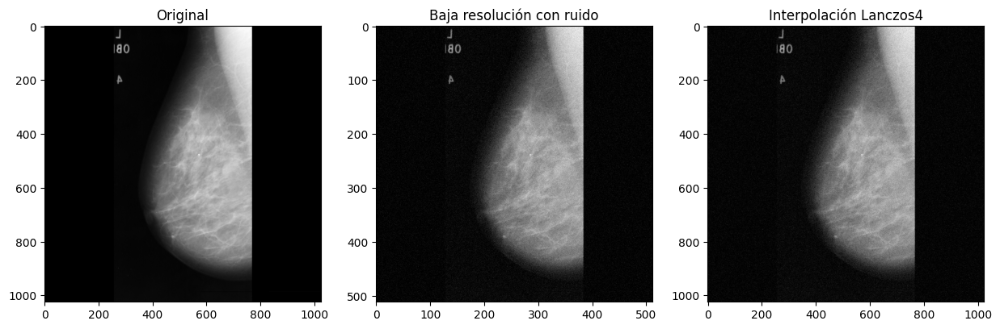

Imagen 3 - PSNR: 30.56, SSIM: 0.3965


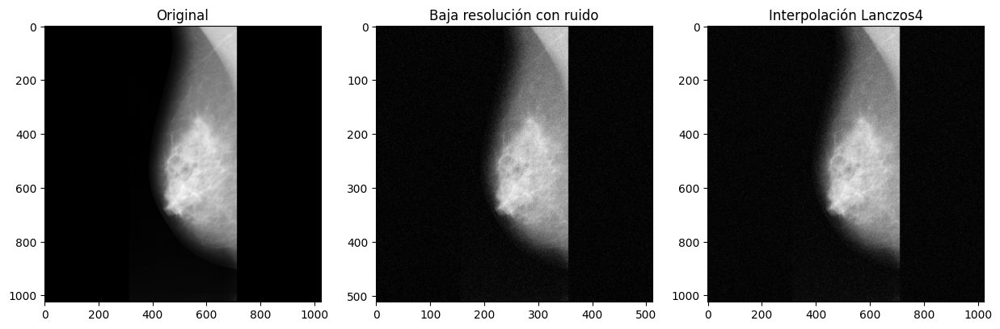

Imagen 4 - PSNR: 30.74, SSIM: 0.3205


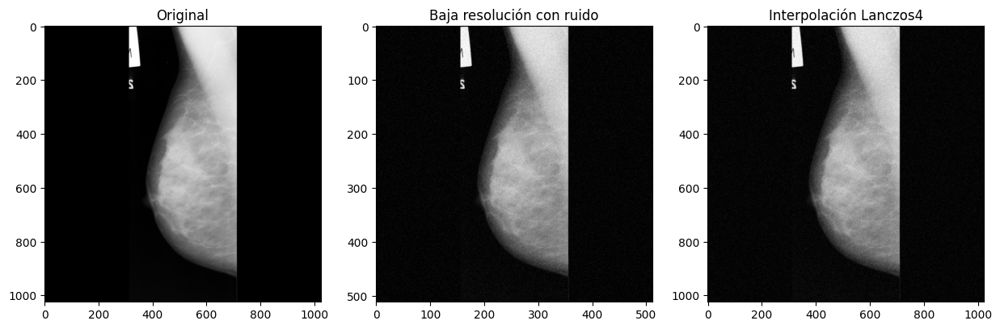

Imagen 5 - PSNR: 30.37, SSIM: 0.3275
PSNR promedio Lanczos4: 30.51, SSIM promedio Lanczos4: 0.3736



In [5]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.metrics import peak_signal_noise_ratio as compare_psnr
from skimage.metrics import structural_similarity as compare_ssim

# Directorio de imágenes
data_dir = "mias/all-mias/"

# Cargar imágenes
images = []
for file_name in os.listdir(data_dir):
    if file_name.endswith('.pgm'):
        img_path = os.path.join(data_dir, file_name)
        img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
        images.append(img)

# Normalización y preparación
images = np.array(images)
images = images.astype('float32') / 255.0

# Convertir imágenes en escala de grises a imágenes RGB
val_images = images[:10]
val_images_rgb = [np.stack((img,)*3, axis=-1) for img in val_images]

# Realizar la bajada de resolución
val_images_resized = [cv2.resize(img, (img.shape[1]//2, img.shape[0]//2)) for img in val_images_rgb]

# Añadir ruido gaussiano a las imágenes de baja resolución
noise_std = 0.05
val_images_noisy = [img + noise_std * np.random.randn(*img.shape) for img in val_images_resized]
val_images_noisy = np.clip(val_images_noisy, 0, 1)  # Asegurarse de que los valores estén en el rango [0, 1]

# Convertir imágenes a uint8 para OpenCV
val_images_noisy_uint8 = [np.uint8(img * 255) for img in val_images_noisy]

# Métodos de interpolación en OpenCV
interpolation_methods = {
    "Nearest": cv2.INTER_NEAREST,
    "Linear": cv2.INTER_LINEAR,
    "Cubic": cv2.INTER_CUBIC,
    "Lanczos4": cv2.INTER_LANCZOS4
}

# Realizar la interpolación y la comparación
for method_name, method in interpolation_methods.items():
    print(f"Evaluando método de interpolación: {method_name}")

    psnr_values = []
    ssim_values = []

    interpolated_images = [cv2.resize(img, (img.shape[1]*2, img.shape[0]*2), interpolation=method) for img in val_images_noisy_uint8]

    for i in range(5):
        plt.figure(figsize=(15, 5))

        plt.subplot(1, 3, 1)
        plt.title('Original')
        plt.imshow(val_images[i], cmap='gray')

        plt.subplot(1, 3, 2)
        plt.title('Baja resolución con ruido')
        plt.imshow(cv2.cvtColor(val_images_noisy_uint8[i], cv2.COLOR_BGR2GRAY), cmap='gray')

        plt.subplot(1, 3, 3)
        plt.title(f'Interpolación {method_name}')
        plt.imshow(cv2.cvtColor(interpolated_images[i], cv2.COLOR_BGR2GRAY), cmap='gray')
        plt.show()

        # Calcular PSNR y SSIM
        original_img = (val_images[i] * 255).astype(np.uint8)
        interpolated_img_gray = cv2.cvtColor(interpolated_images[i], cv2.COLOR_BGR2GRAY)

        psnr_value = compare_psnr(original_img, interpolated_img_gray)
        ssim_value = compare_ssim(original_img, interpolated_img_gray)

        psnr_values.append(psnr_value)
        ssim_values.append(ssim_value)

        print(f'Imagen {i+1} - PSNR: {psnr_value:.2f}, SSIM: {ssim_value:.4f}')

    # Mostrar los valores promedio de PSNR y SSIM
    average_psnr = np.mean(psnr_values)
    average_ssim = np.mean(ssim_values)
    print(f'PSNR promedio {method_name}: {average_psnr:.2f}, SSIM promedio {method_name}: {average_ssim:.4f}\n')